# EDA on DATASETS (Higgs, CoverType, HELOC)

In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.preprocessing import Normalizer
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')


In [78]:
covt_train = pd.read_csv("covtype_train.csv")
heloc_train= pd.read_csv('heloc_train.csv')
higgs_train = pd.read_csv("higgs_train.csv")



# Cover Type

### Distribution Cover_Type

In [79]:
covt_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58101 entries, 0 to 58100
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Elevation                           58101 non-null  int64
 1   Aspect                              58101 non-null  int64
 2   Slope                               58101 non-null  int64
 3   Horizontal_Distance_To_Hydrology    58101 non-null  int64
 4   Vertical_Distance_To_Hydrology      58101 non-null  int64
 5   Horizontal_Distance_To_Roadways     58101 non-null  int64
 6   Hillshade_9am                       58101 non-null  int64
 7   Hillshade_Noon                      58101 non-null  int64
 8   Hillshade_3pm                       58101 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  58101 non-null  int64
 10  Wilderness_Area1                    58101 non-null  int64
 11  Wilderness_Area2                    58101 non-null  int64
 12  Wild

In [80]:
covt_train.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,3351,206,27,726,124,3813,192,252,180,2271,...,0,0,0,0,0,0,1,0,0,1
1,2732,129,7,212,1,1082,231,236,137,912,...,0,0,0,0,0,0,0,0,0,2
2,2572,24,9,201,25,957,216,222,142,2191,...,0,0,0,0,0,0,0,0,0,2
3,2824,69,13,417,39,3223,233,214,110,6478,...,0,0,0,0,0,0,0,0,0,2
4,2529,84,5,120,9,1092,227,231,139,4983,...,0,0,0,0,0,0,0,0,0,2


In [81]:
covt_train.tail()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
58096,3160,315,8,0,0,1366,199,234,174,1129,...,0,0,0,0,0,0,0,0,0,1
58097,2607,45,12,242,52,977,223,214,123,1342,...,0,0,0,0,0,0,0,0,0,2
58098,2317,280,25,190,64,433,144,233,225,582,...,0,0,0,0,0,0,0,0,0,3
58099,3183,89,17,60,8,3443,243,211,91,443,...,0,0,0,0,0,0,0,0,0,1
58100,3177,171,22,108,39,722,229,244,135,2444,...,0,0,0,0,0,0,0,0,0,2


In [82]:
missing_values = covt_train.isna().sum()
print(missing_values)

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


In [83]:
#unique values 
covt_train.nunique()

Elevation                             1734
Aspect                                 361
Slope                                   57
Horizontal_Distance_To_Hydrology       460
Vertical_Distance_To_Hydrology         548
Horizontal_Distance_To_Roadways       5152
Hillshade_9am                          190
Hillshade_Noon                         154
Hillshade_3pm                          252
Horizontal_Distance_To_Fire_Points    4927
Wilderness_Area1                         2
Wilderness_Area2                         2
Wilderness_Area3                         2
Wilderness_Area4                         2
Soil_Type1                               2
Soil_Type2                               2
Soil_Type3                               2
Soil_Type4                               2
Soil_Type5                               2
Soil_Type6                               2
Soil_Type7                               2
Soil_Type8                               2
Soil_Type9                               2
Soil_Type10

There are 7 cover types
40 soil types 
4 wilderness areas

Other features:
Elevation                             
Aspect                                
Slope                                   
Horizontal_Distance_To_Hydrology       
Vertical_Distance_To_Hydrology         
Horizontal_Distance_To_Roadways      
Hillshade_9am                         
Hillshade_Noon                         
Hillshade_3pm                          
Horizontal_Distance_To_Fire_Points  

In [84]:
covt_train.isnull()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58096,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
58097,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
58098,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
58099,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [85]:
#the number of values in different cover types
covt_train.value_counts(['Cover_Type']).sort_index()

Cover_Type
1             21297
2             28248
3              3607
4               259
5               932
6              1706
7              2052
Name: count, dtype: int64

In [86]:
#Correlation

covt_train.corr()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Elevation,1.000000,0.010435,-0.238112,0.306721,0.095186,0.362678,0.109985,0.197872,0.056291,0.144964,...,0.169584,0.070383,0.008643,0.082416,0.017540,0.035369,0.217175,0.193352,0.217102,-0.268264
Aspect,0.010435,1.000000,0.075075,0.016237,0.062913,0.024600,-0.581089,0.336685,0.645140,-0.108300,...,0.065950,0.023431,0.011937,-0.023084,0.001487,-0.022186,0.023408,0.001592,-0.016498,0.016260
Slope,-0.238112,0.075075,1.000000,-0.013878,0.271948,-0.211136,-0.318395,-0.525222,-0.180978,-0.183720,...,-0.134401,0.210039,-0.013592,-0.021101,0.002766,0.007228,-0.069904,0.093695,0.022523,0.145731
Horizontal_Distance_To_Hydrology,0.306721,0.016237,-0.013878,1.000000,0.601254,0.071890,-0.024807,0.045053,0.049917,0.051798,...,0.129254,0.095704,0.068458,-0.003746,0.030842,-0.008300,0.037745,0.031262,0.148339,-0.024854
Vertical_Distance_To_Hydrology,0.095186,0.062913,0.271948,0.601254,1.000000,-0.042477,-0.160286,-0.111975,0.029529,-0.069990,...,0.040071,0.160410,0.054933,-0.007700,0.009484,-0.008029,-0.009375,0.048556,0.179741,0.076705
Horizontal_Distance_To_Roadways,0.362678,0.024600,-0.211136,0.071890,-0.042477,1.000000,0.033537,0.183663,0.102469,0.332752,...,-0.086498,-0.078575,0.003189,0.001444,0.006225,0.016748,0.077970,0.034564,0.017017,-0.155258
Hillshade_9am,0.109985,-0.581089,-0.318395,-0.024807,-0.160286,0.033537,1.000000,-0.001632,-0.783177,0.129455,...,0.000136,-0.067740,0.005993,0.026325,0.007372,0.009778,0.011670,-0.019896,0.003380,-0.029857
Hillshade_Noon,0.197872,0.336685,-0.525222,0.045053,-0.111975,0.183663,-0.001632,1.000000,0.598603,0.054471,...,0.130721,-0.083801,0.040754,0.004517,0.012730,-0.023532,0.043247,-0.079321,-0.040669,-0.094159
Hillshade_3pm,0.056291,0.645140,-0.180978,0.049917,0.029529,0.102469,-0.783177,0.598603,1.000000,-0.046764,...,0.090694,-0.020674,0.017702,-0.015859,-0.000068,-0.021933,0.024925,-0.040065,-0.026354,-0.050833
Horizontal_Distance_To_Fire_Points,0.144964,-0.108300,-0.183720,0.051798,-0.069990,0.332752,0.129455,0.054471,-0.046764,1.000000,...,-0.090765,-0.058325,-0.031171,0.003190,-0.008474,0.004007,-0.027074,-0.002480,0.009674,-0.109868


There is no correlation for Soil_Type15

<Axes: >

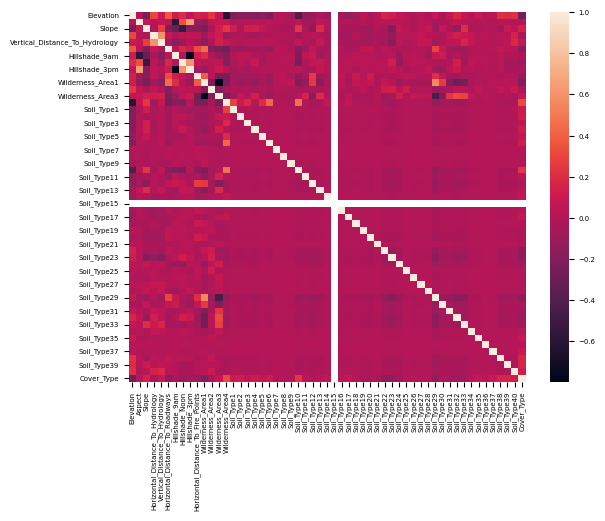

In [87]:
#Correlation plot

sns.heatmap(covt_train.corr())

## Plotting non-categorical features

**With normalization**

In [88]:
covt_train0 = covt_train.iloc[:, 0:10].copy()

In [89]:
covt_train0.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,3351,206,27,726,124,3813,192,252,180,2271
1,2732,129,7,212,1,1082,231,236,137,912
2,2572,24,9,201,25,957,216,222,142,2191
3,2824,69,13,417,39,3223,233,214,110,6478
4,2529,84,5,120,9,1092,227,231,139,4983


In [90]:
covt_train0_norm = Normalizer().fit_transform(covt_train0.values)

In [91]:
covt_train0_norm = pd.DataFrame(covt_train0_norm, columns = covt_train0.columns)

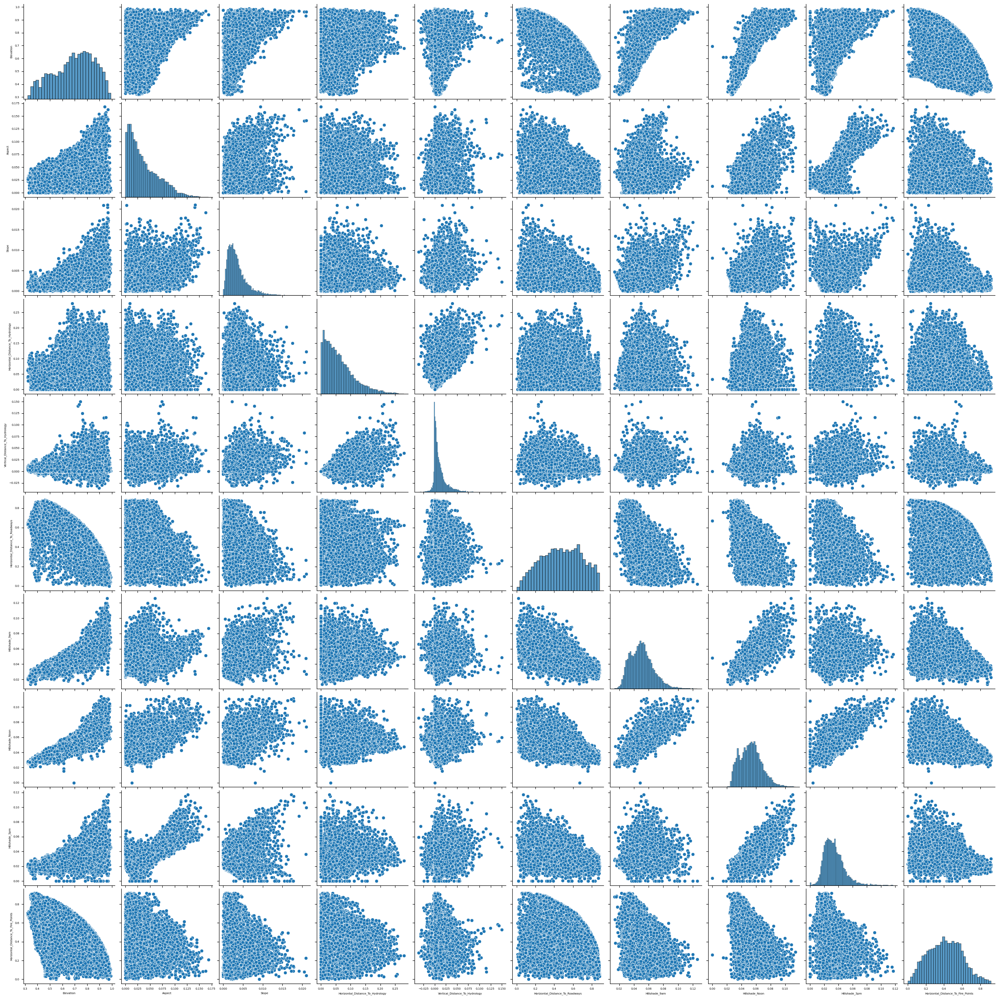

In [92]:
plot = covt_train0_norm.sample(10000, random_state=42)
sns.pairplot(plot)

Looking at the plot, we can see the following: 

- none of the features is even closely normally distributed
- Elevation, Horizontal_Distance_To_Roadways, Hillshades, Horizontal_Distance_To_Fire_Points have a more or less un-skweded distribution
- Aspect, Slope, Horizontal_Distance_To_Hydrology, Vertical_Distance_To_Hydrology have a highly skewed distribution
- The scatter plots show alot of structure which implies dependence on the features on each other
- Some of them seem correlated: Hillshades x Hillshades, Elevation x Hillshades, Aspect x Hillshade, 

### Labels

<BarContainer object of 7 artists>

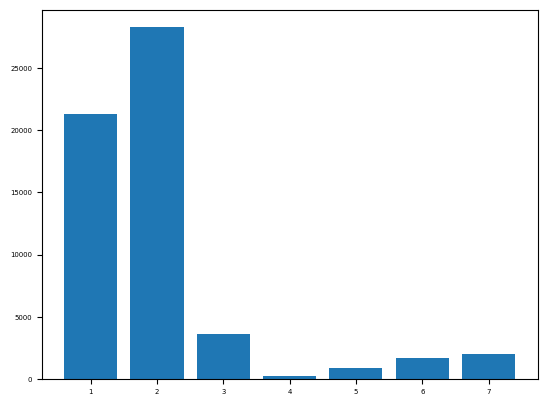

In [93]:
covt_plot = covt_train.groupby("Cover_Type").agg(n = ("Cover_Type", "count")).reset_index()
plt.bar(covt_plot['Cover_Type'], covt_plot['n'])

We can see: 

- The labels are highly imbalanced

### Categorical features

**Wilderness type**

<BarContainer object of 4 artists>

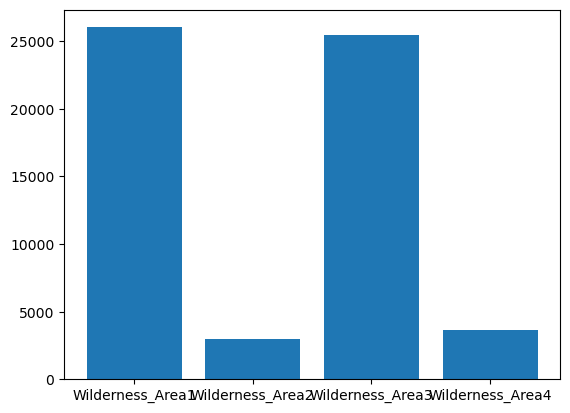

In [18]:
wilderness = covt_train[['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4']].copy()
covt_train0['wilderness_area'] = wilderness.idxmax(1)
covt_plot = covt_train0.groupby("wilderness_area").agg(n = ("wilderness_area", "count")).reset_index()
plt.bar(covt_plot['wilderness_area'], covt_plot['n'])

Highly imbalanced feature

**Soil type**

<BarContainer object of 31 artists>

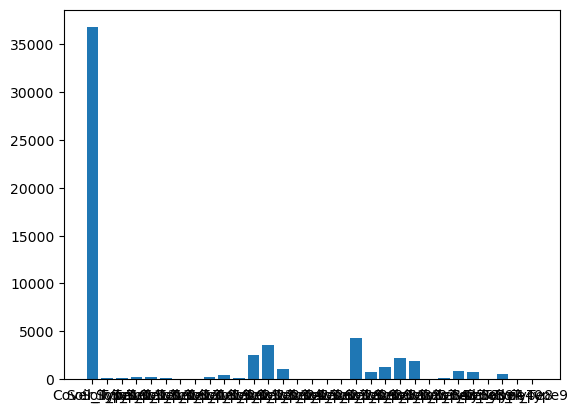

In [19]:
soil = covt_train.iloc[:, 14:55]
covt_train0['soil_type'] = soil.idxmax(1)
covt_plot = covt_train0.groupby("soil_type").agg(n = ("soil_type", "count")).reset_index()
plt.bar(covt_plot['soil_type'], covt_plot['n'])

- soil type is highly imbalanced

### Summary

Main challenges:
- highly imbalanced data set: labels are imbalanced, categorical features imbalanced
- 10 non-categorical features vs. 2 categorical -> leading to 45 one-hot encoded cat. features  vs. 10 numerical
- numerical features skewed
- features depend on each other, e.g. hillshade correlated, slope x hillshade, etc.


# Heloc

In [20]:
heloc_train.info()
heloc_train.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9413 entries, 0 to 9412
Data columns (total 24 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   RiskPerformance                     9413 non-null   object
 1   ExternalRiskEstimate                9413 non-null   int64 
 2   MSinceOldestTradeOpen               9413 non-null   int64 
 3   MSinceMostRecentTradeOpen           9413 non-null   int64 
 4   AverageMInFile                      9413 non-null   int64 
 5   NumSatisfactoryTrades               9413 non-null   int64 
 6   NumTrades60Ever2DerogPubRec         9413 non-null   int64 
 7   NumTrades90Ever2DerogPubRec         9413 non-null   int64 
 8   PercentTradesNeverDelq              9413 non-null   int64 
 9   MSinceMostRecentDelq                9413 non-null   int64 
 10  MaxDelq2PublicRecLast12M            9413 non-null   int64 
 11  MaxDelqEver                         9413 non-null   int6

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
count,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,...,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000,9413.000000
mean,67.362265,184.131626,8.516945,73.869648,19.352385,0.041007,-0.144481,86.579518,6.796770,4.919579,...,32.122703,-0.353235,0.862637,0.805800,31.564326,39.007330,3.160948,0.956443,0.003931,62.080102
std,21.248076,110.426203,13.337636,38.989435,13.050191,2.532663,2.388159,26.145560,20.545241,3.776481,...,20.217867,6.072890,3.210913,3.174333,30.054597,42.140626,4.421713,4.085468,3.372328,27.781143
min,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,...,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,63.000000,117.000000,3.000000,52.000000,11.000000,0.000000,0.000000,87.000000,-7.000000,4.000000,...,20.000000,-7.000000,0.000000,0.000000,5.000000,-8.000000,2.000000,1.000000,0.000000,48.000000
50%,71.000000,177.000000,5.000000,74.000000,19.000000,0.000000,0.000000,96.000000,-7.000000,6.000000,...,31.000000,0.000000,1.000000,1.000000,25.000000,47.000000,3.000000,2.000000,0.000000,67.000000
75%,79.000000,251.000000,11.000000,95.000000,27.000000,1.000000,0.000000,100.000000,14.000000,7.000000,...,44.000000,1.000000,2.000000,2.000000,54.000000,79.000000,5.000000,3.000000,1.000000,82.000000
max,94.000000,803.000000,383.000000,383.000000,79.000000,19.000000,19.000000,100.000000,83.000000,9.000000,...,100.000000,24.000000,66.000000,66.000000,232.000000,471.000000,32.000000,23.000000,18.000000,100.000000


In [95]:
heloc_train.tail()

,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
9408,Bad,65,115,11,43,19,0,0,90,1,...,50,-7,0,0,52,77,5,6,0,85
9409,Bad,77,437,8,115,35,0,0,100,-7,...,26,1,3,3,23,74,6,2,0,50
9410,Good,75,140,7,56,21,0,0,100,-7,...,27,0,1,1,20,63,3,2,1,56
9411,Bad,64,92,3,35,21,2,2,91,33,...,23,0,1,1,9,58,3,4,0,53
9412,Bad,-9,-9,-9,-9,-9,-9,-9,-9,-9,...,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9


In [96]:
#checking missing values
missing_values = heloc_train.isna().sum()
print(missing_values)

RiskPerformance                       0
ExternalRiskEstimate                  0
MSinceOldestTradeOpen                 0
MSinceMostRecentTradeOpen             0
AverageMInFile                        0
NumSatisfactoryTrades                 0
NumTrades60Ever2DerogPubRec           0
NumTrades90Ever2DerogPubRec           0
PercentTradesNeverDelq                0
MSinceMostRecentDelq                  0
MaxDelq2PublicRecLast12M              0
MaxDelqEver                           0
NumTotalTrades                        0
NumTradesOpeninLast12M                0
PercentInstallTrades                  0
MSinceMostRecentInqexcl7days          0
NumInqLast6M                          0
NumInqLast6Mexcl7days                 0
NetFractionRevolvingBurden            0
NetFractionInstallBurden              0
NumRevolvingTradesWBalance            0
NumInstallTradesWBalance              0
NumBank2NatlTradesWHighUtilization    0
PercentTradesWBalance                 0
dtype: int64


***Check pseudo-categorical***

In [99]:
#check unique values
heloc_train.nunique()

RiskPerformance                         2
ExternalRiskEstimate                   61
MSinceOldestTradeOpen                 524
MSinceMostRecentTradeOpen             111
AverageMInFile                        234
NumSatisfactoryTrades                  74
NumTrades60Ever2DerogPubRec            19
NumTrades90Ever2DerogPubRec            17
PercentTradesNeverDelq                 72
MSinceMostRecentDelq                   87
MaxDelq2PublicRecLast12M               10
MaxDelqEver                             8
NumTotalTrades                         86
NumTradesOpeninLast12M                 19
PercentInstallTrades                   95
MSinceMostRecentInqexcl7days           28
NumInqLast6M                           27
NumInqLast6Mexcl7days                  27
NetFractionRevolvingBurden            128
NetFractionInstallBurden              136
NumRevolvingTradesWBalance             30
NumInstallTradesWBalance               20
NumBank2NatlTradesWHighUtilization     19
PercentTradesWBalance             

In [100]:
heloc_train.groupby(['MaxDelqEver', 'RiskPerformance']).size()

MaxDelqEver  RiskPerformance
-9           Bad                 296
             Good                241
 2           Bad                 464
             Good                200
 3           Bad                 179
             Good                102
 4           Bad                 197
             Good                 96
 5           Bad                 570
             Good                301
 6           Bad                1534
             Good               1034
 7           Bad                  50
             Good                 70
 8           Bad                1635
             Good               2444
dtype: int64

In [102]:
heloc_train.groupby(['MaxDelq2PublicRecLast12M', 'RiskPerformance']).size()

MaxDelq2PublicRecLast12M  RiskPerformance
-9                        Bad                 296
                          Good                241
 0                        Bad                 223
                          Good                 80
 1                        Bad                  28
                          Good                 16
 2                        Bad                  35
                          Good                 15
 3                        Bad                 142
                          Good                 60
 4                        Bad                1045
                          Good                386
 5                        Bad                 151
                          Good                 61
 6                        Bad                1545
                          Good               1296
 7                        Bad                1456
                          Good               2332
 9                        Bad                   4
        

No issue is seen.

In [22]:
heloc_encoded = pd.get_dummies(heloc_train, columns=['RiskPerformance'], drop_first=True)

In [27]:
heloc_encoded.head()

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance,RiskPerformance_Good
0,69,148,4,66,41,0,0,100,-7,7,...,-7,1,1,32,60,7,3,1,50,False
1,77,229,3,109,23,0,0,100,-7,7,...,0,0,0,38,93,4,3,1,58,False
2,58,46,7,38,13,0,0,93,8,4,...,-7,2,2,80,84,5,4,1,90,False
3,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,...,-9,-9,-9,-9,-9,-9,-9,-9,-9,False
4,80,226,2,66,35,0,0,100,-7,7,...,0,0,0,2,77,5,7,0,62,False


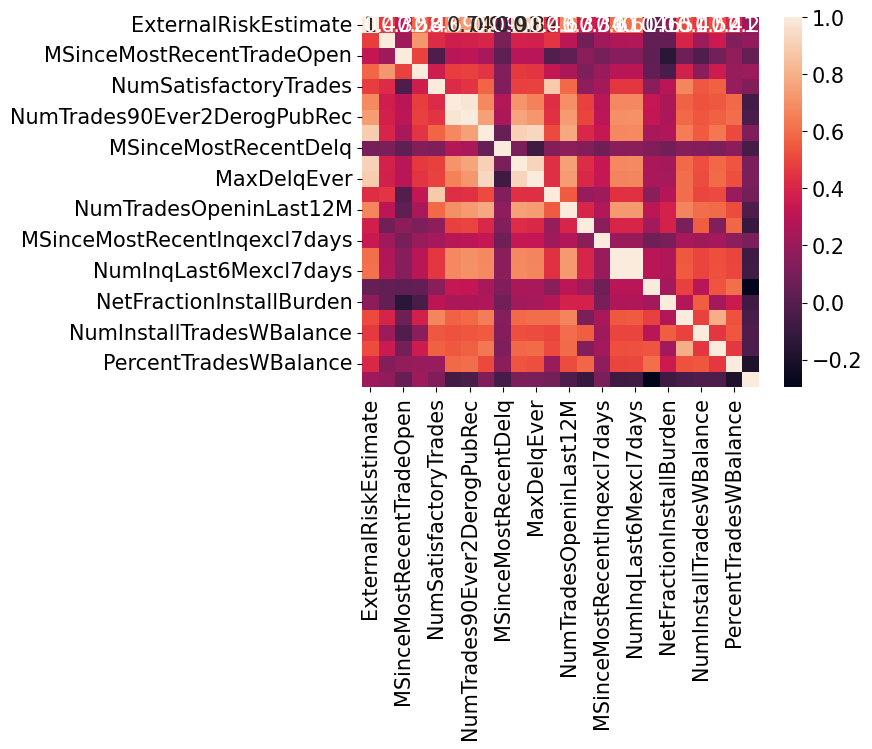

In [28]:
corr_matrix= heloc_encoded.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

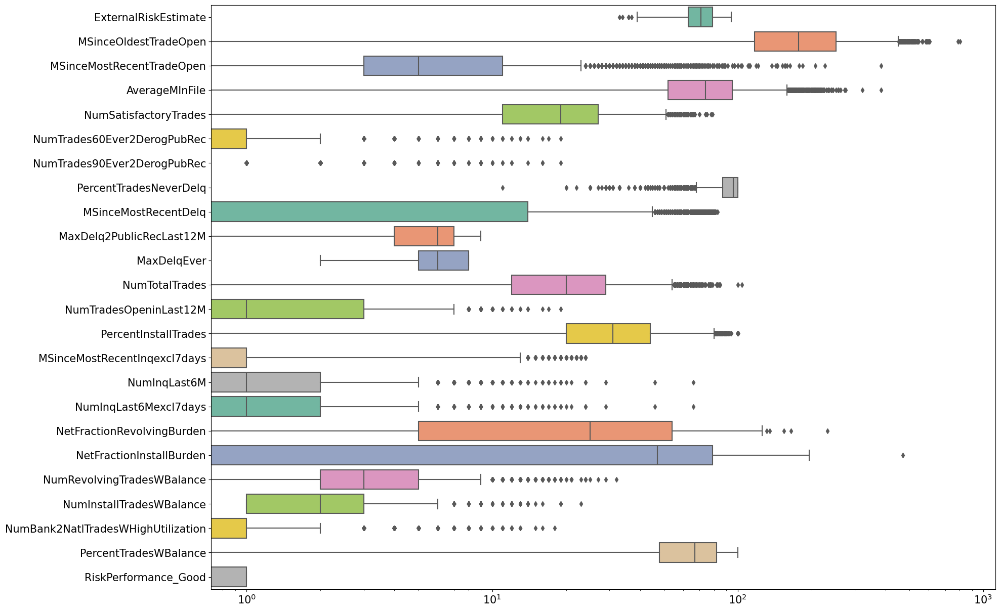

In [31]:
from matplotlib import pyplot 

pyplot.rcParams['font.size'] = 15
plt.figure(figsize=(20, 15))
sns.boxplot(data=heloc_encoded, orient="h", palette="Set2")
pyplot.xscale('log')
pyplot.show()

**Check skewedness and transform**

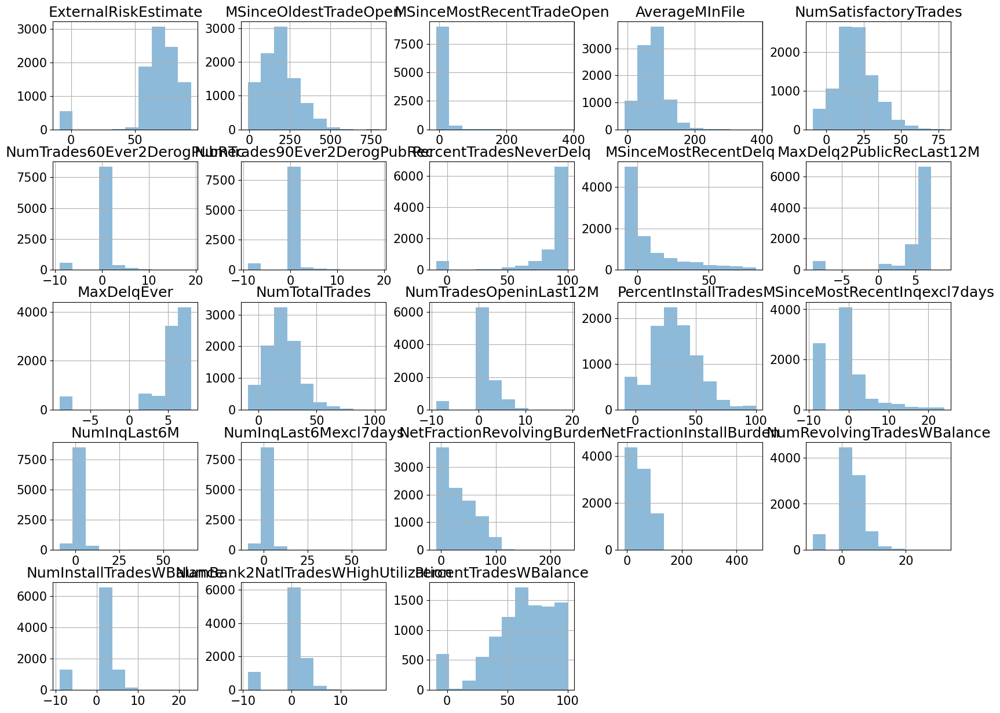

In [112]:
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot
pyplot.rcParams['font.size'] = 15
heloc_encoded.hist(alpha=0.5, figsize=(20, 15))
pyplot.show()



In [114]:
def transform_heloc(data):
  pt = sklearn.preprocessing.PowerTransformer(method='box-cox', standardize=False)
  arr = data[0].values
  arr = arr+1
  pt.fit(arr)
  transformed = pt.transform(arr)
  if len(data)>1:
      arr2 = data[1].values
      arr2 = arr2+1
      transformed2 = pt.transform(arr2)
      transformed2 = pd.DataFrame(transformed2, columns=data[0].columns)
  transformed = pd.DataFrame(transformed, columns=data[0].columns)
  return [transformed, transformed]

In [116]:
transformed = transform_heloc([heloc_encoded])
plt.rcParams['font.size'] = 15
transformed[0].hist(alpha=0.5, figsize=(20, 15))
plt.show()

ValueError: The Box-Cox transformation can only be applied to strictly positive data

# Higgs

In [53]:
# An overview of features

higgs_train.columns
higgs_train.info()
higgs_train.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175000 entries, 0 to 174999
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   EventId                      175000 non-null  int64  
 1   DER_mass_MMC                 175000 non-null  float64
 2   DER_mass_transverse_met_lep  175000 non-null  float64
 3   DER_mass_vis                 175000 non-null  float64
 4   DER_pt_h                     175000 non-null  float64
 5   DER_deltaeta_jet_jet         175000 non-null  float64
 6   DER_mass_jet_jet             175000 non-null  float64
 7   DER_prodeta_jet_jet          175000 non-null  float64
 8   DER_deltar_tau_lep           175000 non-null  float64
 9   DER_pt_tot                   175000 non-null  float64
 10  DER_sum_pt                   175000 non-null  float64
 11  DER_pt_ratio_lep_tau         175000 non-null  float64
 12  DER_met_phi_centrality       175000 non-null  float64
 13 

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight
count,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,...,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000,175000.000000
mean,225110.493577,-49.628612,49.325133,81.233778,57.918801,-708.004070,-600.483421,-708.941271,2.372299,18.925814,...,209.819631,0.979446,-348.062386,-399.054142,-399.062132,-691.944552,-708.705097,-708.699918,73.124907,1.648737
std,72145.054611,407.218564,35.357137,41.118403,63.731894,454.672731,658.960711,453.211529,0.783185,22.683781,...,126.381975,0.977010,532.962806,489.297453,489.291001,480.073109,453.577747,453.585577,98.028052,1.874832
min,100000.000000,-999.000000,0.000000,6.329000,0.000000,-999.000000,-999.000000,-999.000000,0.208000,0.000000,...,13.678000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.001502
25%,162570.500000,77.947750,19.306000,59.338750,14.060750,-999.000000,-999.000000,-999.000000,1.809000,2.841000,...,123.069500,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.018636
50%,225152.500000,104.934000,46.657500,73.708000,38.514500,-999.000000,-999.000000,-999.000000,2.489000,12.227500,...,179.784500,1.000000,38.951500,-1.873000,-2.095000,-999.000000,-999.000000,-999.000000,40.506000,1.168049
75%,287590.250000,130.581250,73.628000,92.230000,79.256750,0.496000,83.633250,-4.564750,2.960000,27.563000,...,263.384000,2.000000,75.492000,0.436250,0.499000,33.738500,-2.447750,-2.265000,109.974000,2.407250
max,349999.000000,988.199000,594.287000,1329.913000,2834.999000,8.503000,4974.979000,16.648000,5.655000,2834.999000,...,2003.976000,3.000000,1120.573000,4.492000,3.141000,706.672000,4.500000,3.142000,1633.433000,7.822543


In [97]:
missing_values = higgs_train.isna().sum()
print(missing_values)

EventId                        0
DER_mass_MMC                   0
DER_mass_transverse_met_lep    0
DER_mass_vis                   0
DER_pt_h                       0
DER_deltaeta_jet_jet           0
DER_mass_jet_jet               0
DER_prodeta_jet_jet            0
DER_deltar_tau_lep             0
DER_pt_tot                     0
DER_sum_pt                     0
DER_pt_ratio_lep_tau           0
DER_met_phi_centrality         0
DER_lep_eta_centrality         0
PRI_tau_pt                     0
PRI_tau_eta                    0
PRI_tau_phi                    0
PRI_lep_pt                     0
PRI_lep_eta                    0
PRI_lep_phi                    0
PRI_met                        0
PRI_met_phi                    0
PRI_met_sumet                  0
PRI_jet_num                    0
PRI_jet_leading_pt             0
PRI_jet_leading_eta            0
PRI_jet_leading_phi            0
PRI_jet_subleading_pt          0
PRI_jet_subleading_eta         0
PRI_jet_subleading_phi         0
PRI_jet_al

In [54]:
# drop EventId column -> just some Id we dont need
higgs_train = higgs_train.drop(['EventId'], axis=1)
higgs_test = higgs_test.drop(['EventId'], axis=1)

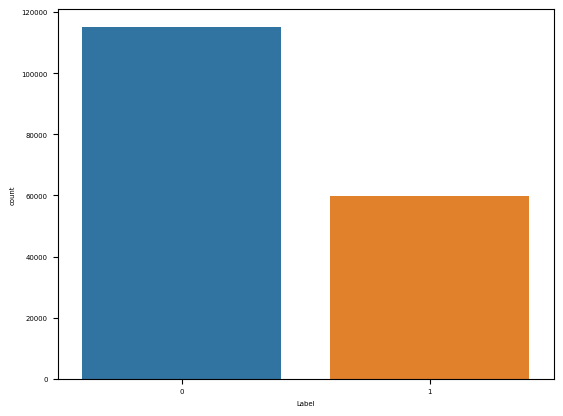

In [47]:
# change target variable
higgs_train['Label'] = higgs_train['Label'].replace({'b': 0, 's': 1})

# An overview of target variable
sns.countplot(x= 'Label',data= higgs_train)
plt.show()

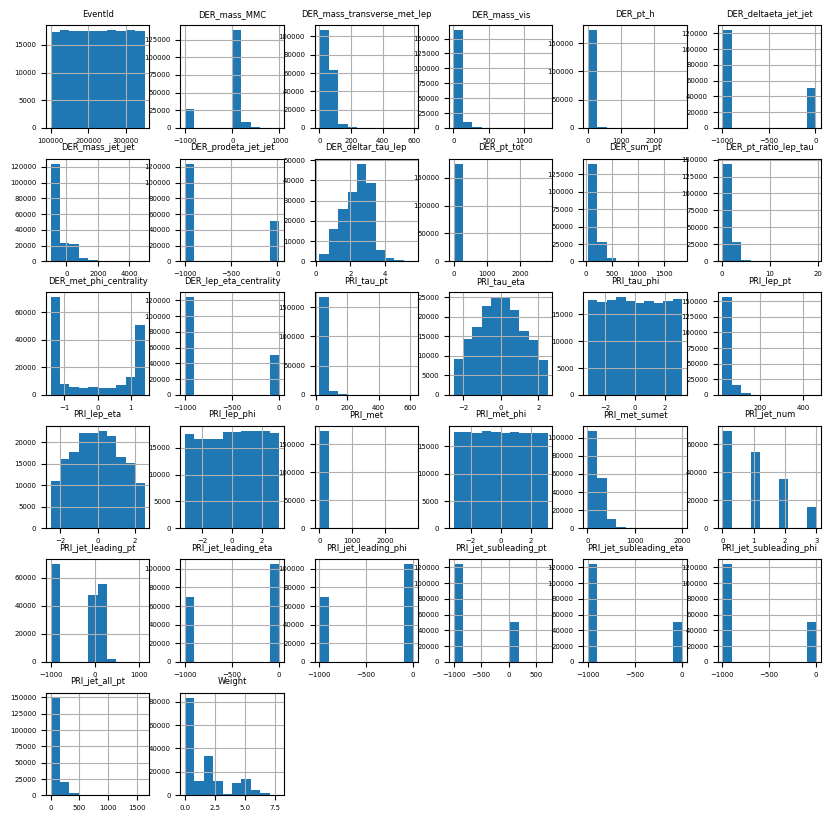

In [34]:
# identify features that basically only have two extreme values
#this might distort the classification because one extreme value might just be associated with one label
sample = higgs_train.sample(1000, random_state=42)
plt.rcParams['font.size'] = 5
higgs_train.hist(figsize=(10, 10))
#pyplot.yscale('log')
plt.show()

In [39]:
# possibly problematic columns
higg_columns_problem = ['DER_mass_MMC',
'DER_deltaeta_jet_jet',
'DER_mass_jet_jet',
'DER_prodeta_jet_jet',
'DER_lep_eta_centrality',
'DER_met_phi_centrality',
'PRI_jet_leading_pt',
'PRI_jet_leading_eta',
'PRI_jet_num',
'PRI_jet_leading_phi',
'PRI_jet_subleading_pt',
'PRI_jet_subleading_eta',
'PRI_jet_subleading_phi',
'PRI_jet_all_pt',
'Weight']

In [45]:
# function to test how "balanced" these features are in terms of label distribution over them
# because these columns have different scales, use median to "divide" values
def test_balancedness(data, columns):
  for column in columns:
    selection = higgs_train[[column, 'Label']].copy()
    print(column)
    print(selection[selection[column] >= selection[column].median()].groupby('Label').size())

In [46]:
test_balancedness(higgs_train,higg_columns_problem)

DER_mass_MMC
Label
b    42076
s    45425
dtype: int64
DER_deltaeta_jet_jet
Label
b    115214
s     59786
dtype: int64
DER_mass_jet_jet
Label
b    115214
s     59786
dtype: int64
DER_prodeta_jet_jet
Label
b    115214
s     59786
dtype: int64
DER_lep_eta_centrality
Label
b    115214
s     59786
dtype: int64
DER_met_phi_centrality
Label
b    47341
s    40168
dtype: int64
PRI_jet_leading_pt
Label
b    50227
s    37273
dtype: int64
PRI_jet_leading_eta
Label
b    54464
s    33045
dtype: int64
PRI_jet_num
Label
b    63019
s    42077
dtype: int64
PRI_jet_leading_phi
Label
b    52513
s    34990
dtype: int64
PRI_jet_subleading_pt
Label
b    115214
s     59786
dtype: int64
PRI_jet_subleading_eta
Label
b    115214
s     59786
dtype: int64
PRI_jet_subleading_phi
Label
b    115214
s     59786
dtype: int64
PRI_jet_all_pt
Label
b    50173
s    37328
dtype: int64
Weight
Label
b    87500
dtype: int64


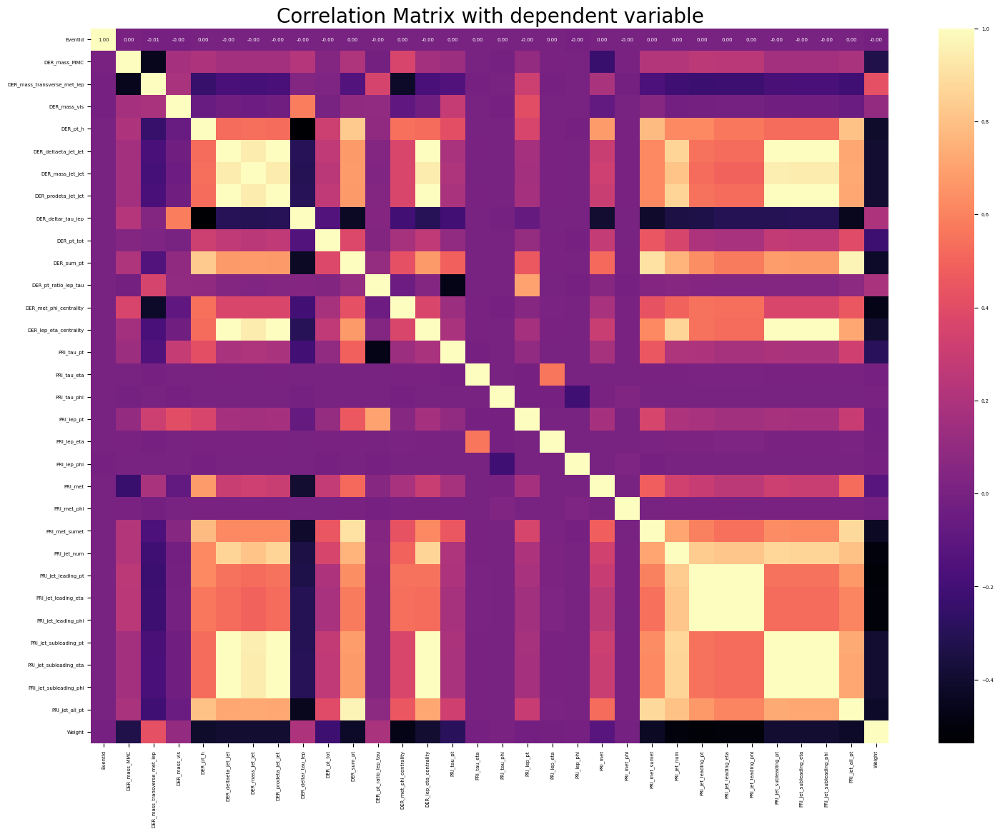

In [38]:
# Correlation Matrix with dependent variable
f, ax = plt.subplots(figsize=[18, 13])
sns.heatmap( higgs_train[numeric_cols].corr(), annot=True, fmt=".2f", ax=ax, cmap="magma")
ax.set_title("Correlation Matrix with dependent variable", fontsize=20)
plt.show()

In [49]:
# identified coluns imbalanced (no hard criteria, just eye measure)
imbalanced_columns = ['DER_deltaeta_jet_jet',
'DER_mass_jet_jet',
'DER_prodeta_jet_jet',
'DER_lep_eta_centrality',
'PRI_jet_subleading_pt',
'PRI_jet_subleading_eta',
'PRI_jet_subleading_phi',
'Weight']

In [51]:
#drop
higgs_train = higgs_train.drop(imbalanced_columns, axis=1)

In [53]:
# PRI_jet_num is int, check distribution over labels
higgs_train.groupby('PRI_jet_num')['Label'].size()

PRI_jet_num
0    69904
1    54243
2    35399
3    15454
Name: Label, dtype: int64

In [55]:
# possibly imbalanced, so drop it for now
higgs_train = higgs_train.drop('PRI_jet_num', axis=1)

**For remaining columns check collinearity**

<Axes: >

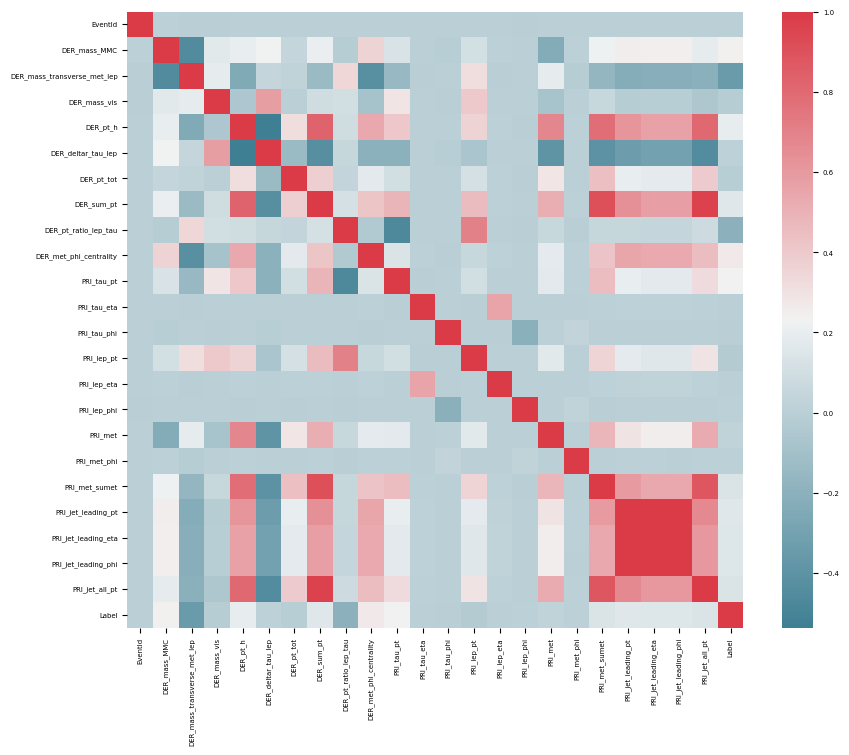

In [61]:
f, ax = plt.subplots(figsize=(10, 8))
corr = higgs_train.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=bool),
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

In [62]:
# all the PRI columsn have a high correlation
coll_columns1 = ['PRI_met_phi', 'PRI_met_sumet', 'PRI_jet_leading_pt', 'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_all_pt']

In [63]:
higgs_train = higgs_train.drop(coll_columns1, axis=1)

<Axes: >

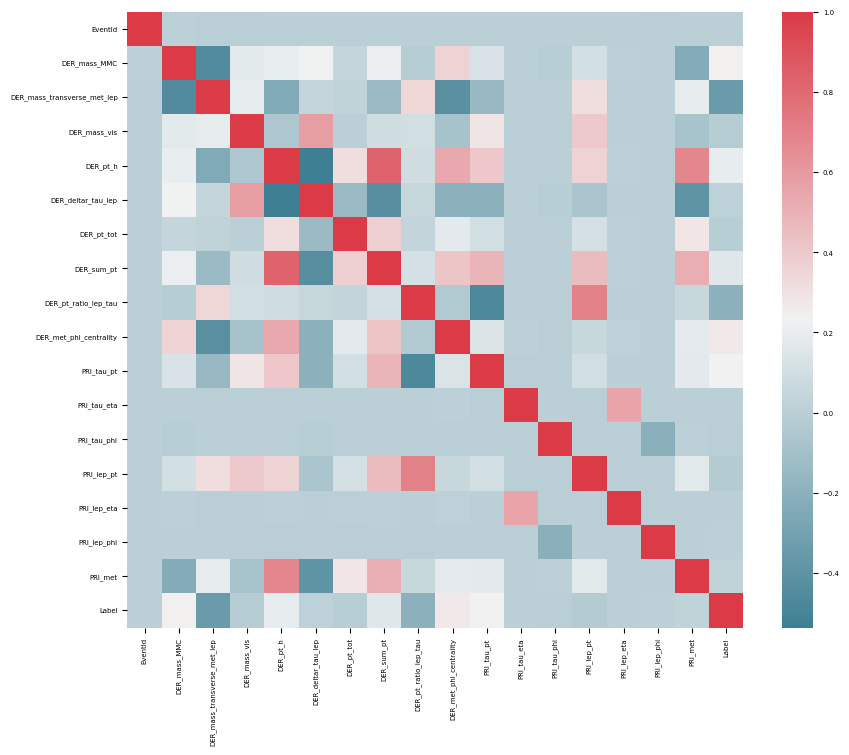

In [66]:
#check again
f, ax = plt.subplots(figsize=(10, 8))
corr = higgs_train.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=bool),
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

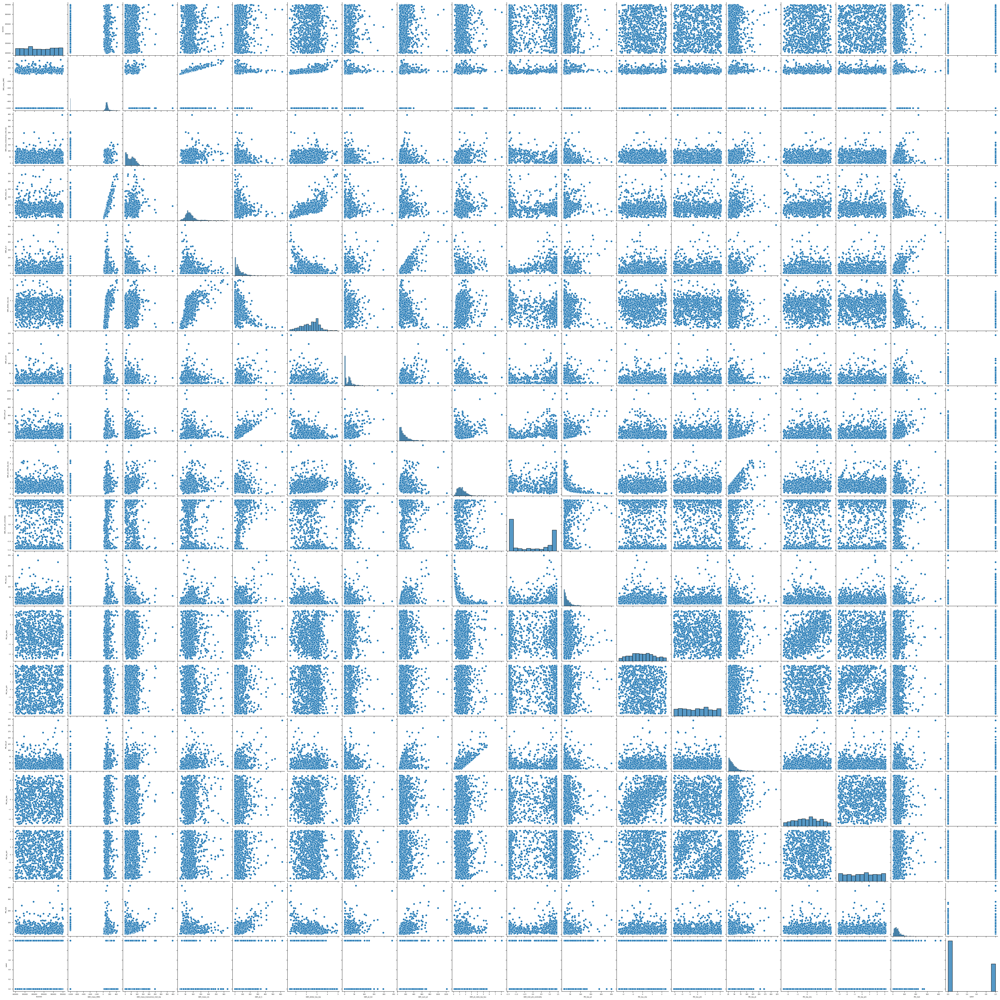

In [68]:
# check for other non-linear relationships between features
# take sample, otherwise too big to plot
higgs_sample = higgs_train.sample(1000, random_state=42)
sns.pairplot(higgs_sample)

There seems to be alot of structure left, but more or less it looks okay except for "DER_mass_MMC" (the distribution of labels seems however to be more or less equal). I left it in for the moment

In [69]:
# final list of columns to drop
higgs_drop = ['EventId',
              'DER_deltaeta_jet_jet',
              'DER_mass_jet_jet',
              'DER_prodeta_jet_jet',
              'DER_lep_eta_centrality',
              'PRI_jet_subleading_pt',
              'PRI_jet_subleading_eta',
              'PRI_jet_subleading_phi',
              'Weight',
              'PRI_jet_num',
              'PRI_met_phi',
              'PRI_met_sumet',
              'PRI_jet_leading_pt',
              'PRI_jet_leading_eta',
              'PRI_jet_leading_phi',
              'PRI_jet_all_pt']